In [1]:
using Plots, Statistics, DelimitedFiles

# Figure 1B

In [2]:
C = 1.0 #uF/cm^2
g_L = 0.1 #mS/cm^2
V_L = -65 # mV
V_T = -59.9 #mV
V_r = -68.0 #mV
τ_ref = 0.0 #ms

spkht = 20.0 #mv

vtmin = -10000 

tmax = 4000 #ms
dt = 0.01 #ms
t_vect = range(0.0, stop = tmax, length = round(Int, tmax/dt))
midpoint = t_vect[round(Int, length(t_vect)/2)]
total_time = (t_vect[end] - midpoint)/1000


tau_syn = 150 #ms


pulsestart = 1415.0 #
pulsestop = 1425.0 #

w_s = 16.5
osc_baseline = -0.4
vtmin = -10000
################################################################
# For simulations with leak:
# g_l_scale = 1.0

# pulseheight = 0.0
# pulseheight2 = 0.325
# pulseheight3 = -0.325

# # # For 2 sp/cycle:
# synapse = 0.014

##############################


###############################################################
#For simulations without leak:
g_l_scale = 0.0 #0.5

pulseheight = 0.0
pulseheight2 = 0.325
pulseheight3 = -0.24

# # For 2 sp/cycle:
synapse = 0.0321

#########################################################

osc_ampl = -1.0 
osc_freq_abs = 8
osc_freq = osc_freq_abs/1000



activity_holder = zeros(length(t_vect))
spike_holder = zeros(length(t_vect))

activity_holder2 = zeros(length(t_vect))
spike_holder2 = zeros(length(t_vect))

activity_holder3 = zeros(length(t_vect))
spike_holder3 = zeros(length(t_vect))

b=0
b2=0
b3=0



v = V_L
vpre = 0.0

v2 = V_L
vpre2 = 0.0

v3 = V_L
vpre3 = 0.0

pulse = 0.0
spikeyesno = 0
spikeok = 1
ref_accum = 0.0

pulse2 = 0.0
spikeyesno2 = 0
spikeok2 = 1
ref_accum2 = 0.0

pulse3 = 0.0
spikeyesno3 = 0
spikeok3 = 1
ref_accum3 = 0.0

for (tidx, t) in enumerate(t_vect)
    
    if t >= pulsestart && t <= pulsestop
        pulse = pulseheight
        pulse2 = pulseheight2
        pulse3 = pulseheight3
    else
        pulse = 0.0
        pulse2 = 0.0
        pulse3 = 0.0
    end

    oscinput = pulse + osc_baseline + (osc_ampl*cos(2*pi*osc_freq*t))
    oscinput2 = pulse2 + osc_baseline + (osc_ampl*cos(2*pi*osc_freq*t))
    oscinput3 = pulse3 + osc_baseline + (osc_ampl*cos(2*pi*osc_freq*t))


    # Main computation: neuron 1
    fv_n = (g_l_scale*-g_L*(v - V_L) + w_s*synapse + oscinput)
    vpre_hat = v + fv_n*(dt/C);
    fv_nplus1 = (g_l_scale*-g_L*(vpre_hat - V_L) + w_s*synapse + oscinput)
    vpre = v + 0.5*(fv_n + fv_nplus1)*(dt/C);
    v = max(vtmin, vpre)
    
    # Main computation: neuron 2
    fv_n2 = (g_l_scale*-g_L*(v2 - V_L) + w_s*synapse + oscinput2)
    vpre_hat2 = v2 + fv_n2*(dt/C);
    fv_nplus12 = (g_l_scale*-g_L*(vpre_hat2 - V_L) + w_s*synapse + oscinput2)
    vpre2 = v2 + 0.5*(fv_n2 + fv_nplus12)*(dt/C);
    v2 = max(vtmin, vpre2)
    
    # Main computation: neuron 3
    fv_n3 = (g_l_scale*-g_L*(v3 - V_L) + w_s*synapse + oscinput3)
    vpre_hat3 = v3 + fv_n3*(dt/C);
    fv_nplus13 = (g_l_scale*-g_L*(vpre_hat3 - V_L) + w_s*synapse + oscinput3)
    vpre3 = v3 + 0.5*(fv_n3 + fv_nplus13)*(dt/C);
    v3 = max(vtmin, vpre3)

    
    #Spike utils: spike 1 ###################
    if v >= V_T && spikeok == 1
        v = spkht
        spikeyesno = 1
        spikeok = 0
        if t>midpoint
            b+=1
            spike_holder[b] = t
        end
    else
        spikeyesno = 0
    end
    
    activity_holder[tidx] = v #b/total_time

    if v >= spkht
        v = V_r
    end


    #compute refractoriness
    if spikeok == 0
        ref_accum += dt
    end

    if ref_accum >= τ_ref
        spikeok = 1
        ref_accum = 0.0
    end
    
    
    #Spike utils: spike 2 ##########################
    if v2 >= V_T && spikeok2 == 1
        v2 = spkht
        spikeyesno2 = 1
        spikeok2 = 0
        if t>midpoint
            b2+=1
            spike_holder2[b2] = t
        end
    else
        spikeyesno2 = 0
    end
    
    activity_holder2[tidx] = v2 #b/total_time

    if v2 >= spkht
        v2 = V_r
    end


    #compute refractoriness
    if spikeok2 == 0
        ref_accum2 += dt
    end

    if ref_accum2 >= τ_ref
        spikeok2 = 1
        ref_accum2 = 0.0
    end
    
    #Spike utils: spike 3 ##########################
    if v3 >= V_T && spikeok3 == 1
        v3 = spkht
        spikeyesno3 = 1
        spikeok3 = 0
        if t>midpoint
            b3+=1
            spike_holder3[b3] = t
        end
    else
        spikeyesno3 = 0
    end
    
    activity_holder3[tidx] = v3 #b/total_time

    if v3 >= spkht
        v3 = V_r
    end


    #compute refractoriness
    if spikeok3 == 0
        ref_accum3 += dt
    end

    if ref_accum3 >= τ_ref
        spikeok3 = 1
        ref_accum3 = 0.0
    end

    
end


ptime_min = 1.0 
ptime_max = 2.0 

pidxs = round(Int, ptime_min*1000/dt):round(Int, ptime_max*1000/dt)

plot1 = plot(title="w/ oscillatory input", xlabel="Time (sec)", ylabel="V", size = (500,300), legend=false)
plot!(plot1, t_vect[pidxs]/1000, activity_holder[pidxs])
plot!(plot1, t_vect[pidxs]/1000, activity_holder2[pidxs])
plot!(plot1, t_vect[pidxs]/1000, activity_holder3[pidxs])

# Figure 1C

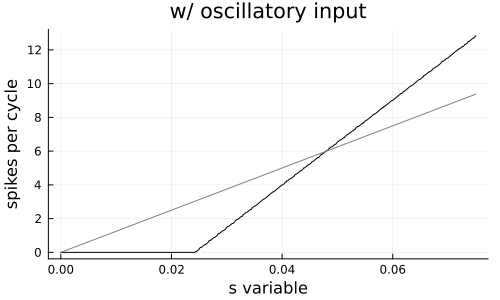

In [3]:
C = 1.0 #uF/cm^2
g_L = 0.1 #mS/cm^2
V_L = -65 # mV
V_T = -59.9 #mV
V_r = -68.0 #mV
τ_ref = 0.0 #ms




dt = 0.1 #ms
tau_syn = 150 #ms


w_s = 16.5 #uA/cm^2
osc_baseline = -0.4 
vtmin = -10000

# For sims with no leak ###################################
s_vect = range(0, stop=0.075, length = 500)
g_l_scale = 0.0 
###########################

# # # For sims with leak ###################################
# s_vect = range(0, stop=0.05, length = 500)
# g_l_scale = 1.0 #0.5
###########################

osc_ampl = -1.0 
osc_freq_abs = 8
osc_freq = osc_freq_abs/1000


tmax = 6000 #ms
t_vect = range(0.0, stop = tmax, length = round(Int, tmax/dt))

activity_holder = zeros(length(s_vect))

for (sidx, sval) in enumerate(s_vect)
    
    spike_holder = zeros(length(t_vect))
    
    b=0
   
    
    midpoint = t_vect[round(Int, length(t_vect)/2)]
    total_time = (t_vect[end] - midpoint)/1000

    v = V_L
    
    synapse = sval
    
    vpre = 0.0
    
    

    spikeyesno = 0
    
    spikeok = 1
    
    ref_accum = 0.0
    
    for (tidx, t) in enumerate(t_vect)

        oscinput = osc_baseline + (osc_ampl*cos(2*pi*osc_freq*t))
        


        # Main computation: RK2
        fv_n = (g_l_scale*-g_L*(v - V_L) + w_s*synapse + oscinput)
        vpre_hat = v + fv_n*(dt/C);
        
        fv_nplus1 = (g_l_scale*-g_L*(vpre_hat - V_L) + w_s*synapse + oscinput)
        vpre = v + 0.5*(fv_n + fv_nplus1)*(dt/C);

        v = max(vtmin, vpre)
        
        
        #test for spike 1
        if v >= V_T && spikeok == 1
            v = V_r
            spikeyesno = 1
            spikeok = 0
            if t>midpoint
                b+=1
                spike_holder[b] = t
            end
        else
            spikeyesno = 0
        end


        #compute refractoriness
        if spikeok == 0
            ref_accum += dt
        end

        if ref_accum >= τ_ref
            spikeok = 1
            ref_accum = 0.0
        end
        
        



    end

    #Store values
    activity_holder[sidx] = b/total_time

    

    
end

plot1 = plot(title="w/ oscillatory input", xlabel="s variable", ylabel="spikes per cycle", size = (500,300), legend=false)
plot!(plot1, s_vect, activity_holder/osc_freq_abs, c=:black)
plot!(plot1, s_vect, s_vect*1000/osc_freq_abs, c=:gray)




plot(plot1)


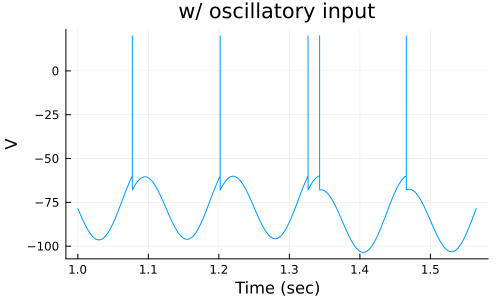

In [12]:
C = 1.0 #uF/cm^2
g_L = 0.1 #mS/cm^2
V_L = -65 # mV
V_T = -59.9 #mV
V_r = -68.0 #mV
τ_ref = 0.0 #ms
tau_syn = 150 #ms

spkht = 20.0 #mv
dt = 0.01 #ms

w_s = 16.5 #uA/cm^2
osc_baseline = -0.4
vtmin = -10000

# For sims with no leak ###################################
g_l_scale = 0.0
# synapse = 0.0275
synapse = 0.0312

#For 1 spike per cycle:
# synapse = 0.02815
#For one cycle with 2 spikes
synapse = 0.02833

# For 2 sp/cycle:
# synapse = 0.032
###########################

# # # For sims with leak ###################################
# g_l_scale = 1.0 
# # For 2 sp/cycle:
# synapse = 0.012
# synapse = 0.02
# For 2 sp/cycle:
# synapse = 0.0123
###########################



osc_ampl = -1.0 
osc_freq_abs = 8
osc_freq = osc_freq_abs/1000


tmax = 4000 #ms
t_vect = range(0.0, stop = tmax, length = round(Int, tmax/dt))
activity_holder = zeros(length(t_vect))
spike_holder = zeros(length(t_vect))

b=0

midpoint = t_vect[round(Int, length(t_vect)/2)]
total_time = (t_vect[end] - midpoint)/1000

v = V_L
vpre = 0.0

spikeyesno = 0
spikeok = 1
ref_accum = 0.0
for (tidx, t) in enumerate(t_vect)

    oscinput = osc_baseline + (osc_ampl*cos(2*pi*osc_freq*t))


    # Main computation    
    fv_n = (g_l_scale*-g_L*(v - V_L) + w_s*synapse + oscinput)
    vpre_hat = v + fv_n*(dt/C);

    fv_nplus1 = (g_l_scale*-g_L*(vpre_hat - V_L) + w_s*synapse + oscinput)
    vpre = v + 0.5*(fv_n + fv_nplus1)*(dt/C);
    
    v = max(vtmin, vpre)

    #test for spike 1
    if v >= V_T && spikeok == 1
        v = spkht
        spikeyesno = 1
        spikeok = 0
        if t>midpoint
            b+=1
            spike_holder[b] = t
        end
    else
        spikeyesno = 0
    end
    
    activity_holder[tidx] = v

    if v >= spkht
        v = V_r
    end


    #compute refractoriness
    if spikeok == 0
        ref_accum += dt
    end

    if ref_accum >= τ_ref
        spikeok = 1
        ref_accum = 0.0
    end

    
end

ptime_min = 1
ptime_max = 1.565

pidxs = round(Int, ptime_min*1000/dt):round(Int, ptime_max*1000/dt)
plot1 = plot(title="w/ oscillatory input", xlabel="Time (sec)", ylabel="V", size = (500,300), legend=false)
plot!(plot1, t_vect[pidxs]/1000, activity_holder[pidxs])

# Figure 1E

In [5]:
C = 1.0 #uF/cm^2
g_L = 0.1 #mS/cm^2
V_L = -65 # mV
V_T = -59.9 #mV
V_r = -68.0 #mV
τ_ref = 0.0 #ms

spkht = 20.0 #mv

vtmin = -10000 # 

tmax = 4000 #ms
dt = 0.01 #ms
t_vect = range(0.0, stop = tmax, length = round(Int, tmax/dt))
midpoint = t_vect[round(Int, length(t_vect)/2)]
total_time = (t_vect[end] - midpoint)/1000


tau_syn = 150 #ms


pulsestart = 1415.0 #ms
pulsestop = 1425.0 #ms

w_s = 16.5
osc_baseline = -0.4
vtmin = -10000
################################################################
# For simulations with leak:
g_l_scale = 1.0

pulseheight = 0.0
pulseheight2 = 0.325
pulseheight3 = -0.325

# # For 2 sp/cycle:
synapse = 0.014

##############################


###############################################################
#For simulations without leak:
# g_l_scale = 0.0 #0.5

# pulseheight = 0.0
# pulseheight2 = 0.325
# pulseheight3 = -0.24

# # # For 2 sp/cycle:
# synapse = 0.0321

#########################################################

osc_ampl = -1.0 
osc_freq_abs = 8
osc_freq = osc_freq_abs/1000



activity_holder = zeros(length(t_vect))
spike_holder = zeros(length(t_vect))

activity_holder2 = zeros(length(t_vect))
spike_holder2 = zeros(length(t_vect))

activity_holder3 = zeros(length(t_vect))
spike_holder3 = zeros(length(t_vect))

b=0
b2=0
b3=0



v = V_L
vpre = 0.0

v2 = V_L
vpre2 = 0.0

v3 = V_L
vpre3 = 0.0

pulse = 0.0
spikeyesno = 0
spikeok = 1
ref_accum = 0.0

pulse2 = 0.0
spikeyesno2 = 0
spikeok2 = 1
ref_accum2 = 0.0

pulse3 = 0.0
spikeyesno3 = 0
spikeok3 = 1
ref_accum3 = 0.0

for (tidx, t) in enumerate(t_vect)
    
    if t >= pulsestart && t <= pulsestop
        pulse = pulseheight
        pulse2 = pulseheight2
        pulse3 = pulseheight3
    else
        pulse = 0.0
        pulse2 = 0.0
        pulse3 = 0.0
    end

    oscinput = pulse + osc_baseline + (osc_ampl*cos(2*pi*osc_freq*t))
    oscinput2 = pulse2 + osc_baseline + (osc_ampl*cos(2*pi*osc_freq*t))
    oscinput3 = pulse3 + osc_baseline + (osc_ampl*cos(2*pi*osc_freq*t))


    # Main computation: neuron 1
    fv_n = (g_l_scale*-g_L*(v - V_L) + w_s*synapse + oscinput)
    vpre_hat = v + fv_n*(dt/C);
    fv_nplus1 = (g_l_scale*-g_L*(vpre_hat - V_L) + w_s*synapse + oscinput)
    vpre = v + 0.5*(fv_n + fv_nplus1)*(dt/C);
    v = max(vtmin, vpre)
    
    # Main computation: neuron 2
    fv_n2 = (g_l_scale*-g_L*(v2 - V_L) + w_s*synapse + oscinput2)
    vpre_hat2 = v2 + fv_n2*(dt/C);
    fv_nplus12 = (g_l_scale*-g_L*(vpre_hat2 - V_L) + w_s*synapse + oscinput2)
    vpre2 = v2 + 0.5*(fv_n2 + fv_nplus12)*(dt/C);
    v2 = max(vtmin, vpre2)
    
    # Main computation: neuron 3
    fv_n3 = (g_l_scale*-g_L*(v3 - V_L) + w_s*synapse + oscinput3)
    vpre_hat3 = v3 + fv_n3*(dt/C);
    fv_nplus13 = (g_l_scale*-g_L*(vpre_hat3 - V_L) + w_s*synapse + oscinput3)
    vpre3 = v3 + 0.5*(fv_n3 + fv_nplus13)*(dt/C);
    v3 = max(vtmin, vpre3)

    
    #Spike utils: spike 1 ###################
    if v >= V_T && spikeok == 1
        v = spkht
        spikeyesno = 1
        spikeok = 0
        if t>midpoint
            b+=1
            spike_holder[b] = t
        end
    else
        spikeyesno = 0
    end
    
    activity_holder[tidx] = v #b/total_time

    if v >= spkht
        v = V_r
    end


    #compute refractoriness
    if spikeok == 0
        ref_accum += dt
    end

    if ref_accum >= τ_ref
        spikeok = 1
        ref_accum = 0.0
    end
    
    
    #Spike utils: spike 2 ##########################
    if v2 >= V_T && spikeok2 == 1
        v2 = spkht
        spikeyesno2 = 1
        spikeok2 = 0
        if t>midpoint
            b2+=1
            spike_holder2[b2] = t
        end
    else
        spikeyesno2 = 0
    end
    
    activity_holder2[tidx] = v2 #b/total_time

    if v2 >= spkht
        v2 = V_r
    end


    #compute refractoriness
    if spikeok2 == 0
        ref_accum2 += dt
    end

    if ref_accum2 >= τ_ref
        spikeok2 = 1
        ref_accum2 = 0.0
    end
    
    #Spike utils: spike 3 ##########################
    if v3 >= V_T && spikeok3 == 1
        v3 = spkht
        spikeyesno3 = 1
        spikeok3 = 0
        if t>midpoint
            b3+=1
            spike_holder3[b3] = t
        end
    else
        spikeyesno3 = 0
    end
    
    activity_holder3[tidx] = v3 #b/total_time

    if v3 >= spkht
        v3 = V_r
    end


    #compute refractoriness
    if spikeok3 == 0
        ref_accum3 += dt
    end

    if ref_accum3 >= τ_ref
        spikeok3 = 1
        ref_accum3 = 0.0
    end

    
end


ptime_min = 1.0 
ptime_max = 2.0 

pidxs = round(Int, ptime_min*1000/dt):round(Int, ptime_max*1000/dt)

plot1 = plot(title="w/ oscillatory input", xlabel="Time (sec)", ylabel="V", size = (500,300), legend=false)
plot!(plot1, t_vect[pidxs]/1000, activity_holder[pidxs])
plot!(plot1, t_vect[pidxs]/1000, activity_holder2[pidxs])
plot!(plot1, t_vect[pidxs]/1000, activity_holder3[pidxs])

# Figure 1F

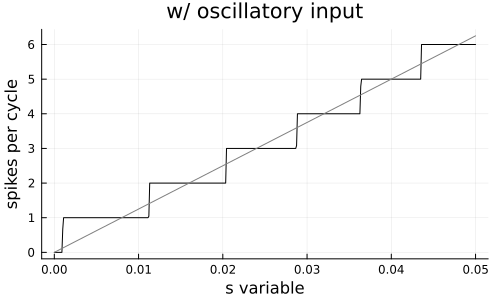

In [6]:
C = 1.0 #uF/cm^2
g_L = 0.1 #mS/cm^2
V_L = -65 # mV
V_T = -59.9 #mV
V_r = -68.0 #mV
τ_ref = 0.0 #ms




dt = 0.1 #ms
tau_syn = 150 #ms


w_s = 16.5 #uA/cm^2
osc_baseline = -0.4 
vtmin = -10000

# For sims with no leak ###################################
# s_vect = range(0, stop=0.075, length = 500)
# g_l_scale = 0.0 #1.0 #0.5
###########################

# # # For sims with leak ###################################
s_vect = range(0, stop=0.05, length = 500)
g_l_scale = 1.0 
###########################

osc_ampl = -1.0 
osc_freq_abs = 8
osc_freq = osc_freq_abs/1000


tmax = 6000 #4000 #ms
t_vect = range(0.0, stop = tmax, length = round(Int, tmax/dt))

activity_holder = zeros(length(s_vect))

for (sidx, sval) in enumerate(s_vect)
    
    spike_holder = zeros(length(t_vect))
    
    b=0
   
    midpoint = t_vect[round(Int, length(t_vect)/2)]
    total_time = (t_vect[end] - midpoint)/1000

    v = V_L
    synapse = sval
    vpre = 0.0
    spikeyesno = 0
    spikeok = 1
    ref_accum = 0.0
    
    for (tidx, t) in enumerate(t_vect)

        oscinput = osc_baseline + (osc_ampl*cos(2*pi*osc_freq*t))

        # Main computation: RK2
        fv_n = (g_l_scale*-g_L*(v - V_L) + w_s*synapse + oscinput)
        vpre_hat = v + fv_n*(dt/C);
        
        fv_nplus1 = (g_l_scale*-g_L*(vpre_hat - V_L) + w_s*synapse + oscinput)
        vpre = v + 0.5*(fv_n + fv_nplus1)*(dt/C);

        v = max(vtmin, vpre)
        
        
        #test for spike 1
        if v >= V_T && spikeok == 1
            v = V_r
            spikeyesno = 1
            spikeok = 0
            if t>midpoint
                b+=1
                spike_holder[b] = t
            end
        else
            spikeyesno = 0
        end


        #compute refractoriness
        if spikeok == 0
            ref_accum += dt
        end

        if ref_accum >= τ_ref
            spikeok = 1
            ref_accum = 0.0
        end

    end

    #Store values
    activity_holder[sidx] = b/total_time
    
end

plot1 = plot(title="w/ oscillatory input", xlabel="s variable", ylabel="spikes per cycle", size = (500,300), legend=false)
plot!(plot1, s_vect, activity_holder/osc_freq_abs, c=:black)
plot!(plot1, s_vect, s_vect*1000/osc_freq_abs, c=:gray)




plot(plot1)


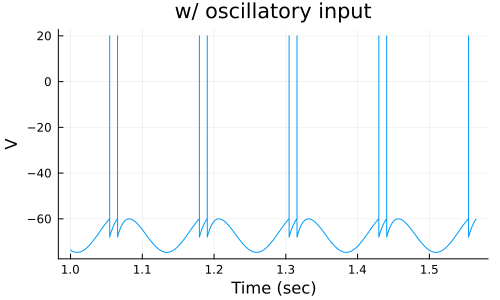

In [10]:
C = 1.0 #1 #uF/cm^2
g_L = 0.1 #mS/cm^2
V_L = -65 # mV
V_T = -59.9 #mV
V_r = -68.0 #mV
τ_ref = 0.0 #ms
tau_syn = 150 #ms

spkht = 20.0 #mv
dt = 0.01 #ms

w_s = 16.5 #uA/cm^2
osc_baseline = -0.4
vtmin = -10000

# For sims with no leak ###################################
# g_l_scale = 0.0
# # synapse = 0.0275
# synapse = 0.0312

# #For 1 spike per cycle:
# synapse = 0.02815
# #For one cycle with 2 spikes
# # synapse = 0.02833

# # For 2 sp/cycle:
# # synapse = 0.032
###########################

# # # For sims with leak ###################################
g_l_scale = 1.0 #0.5
# For 2 sp/cycle:
# synapse = 0.012
synapse = 0.02
###########################



osc_ampl = -1.0 
osc_freq_abs = 8
osc_freq = osc_freq_abs/1000


tmax = 4000 #ms
t_vect = range(0.0, stop = tmax, length = round(Int, tmax/dt))
activity_holder = zeros(length(t_vect))
spike_holder = zeros(length(t_vect))

b=0

midpoint = t_vect[round(Int, length(t_vect)/2)]
total_time = (t_vect[end] - midpoint)/1000

v = V_L
vpre = 0.0

spikeyesno = 0
spikeok = 1
ref_accum = 0.0
for (tidx, t) in enumerate(t_vect)

    oscinput = osc_baseline + (osc_ampl*cos(2*pi*osc_freq*t))


    # Main computation    
    fv_n = (g_l_scale*-g_L*(v - V_L) + w_s*synapse + oscinput)
    vpre_hat = v + fv_n*(dt/C);

    fv_nplus1 = (g_l_scale*-g_L*(vpre_hat - V_L) + w_s*synapse + oscinput)
    vpre = v + 0.5*(fv_n + fv_nplus1)*(dt/C);
    
    v = max(vtmin, vpre)

    #test for spike 1
    if v >= V_T && spikeok == 1
        v = spkht
        spikeyesno = 1
        spikeok = 0
        if t>midpoint
            b+=1
            spike_holder[b] = t
        end
    else
        spikeyesno = 0
    end
    
    activity_holder[tidx] = v

    if v >= spkht
        v = V_r
    end


    #compute refractoriness
    if spikeok == 0
        ref_accum += dt
    end

    if ref_accum >= τ_ref
        spikeok = 1
        ref_accum = 0.0
    end

    
end

ptime_min = 1
ptime_max = 1.565

pidxs = round(Int, ptime_min*1000/dt):round(Int, ptime_max*1000/dt)
plot1 = plot(title="w/ oscillatory input", xlabel="Time (sec)", ylabel="V", size = (500,300), legend=false)
plot!(plot1, t_vect[pidxs]/1000, activity_holder[pidxs])